`63070501061 S.RAKNA`

# 1. Calibrate Camera

> 2 hrs.

#### Using the `Calibrate Camera by ChatGPT` program shown in class, 

- Calibrate your laptop or mobile phone camera to find its intrinsic parameters using **10-15 checkerboard images**. 
- Make sure you are not using mirror images. 

If the processing is slow, it may help to reduce the size of each image to a width of around 1,000.

> 10 points.

##### 1.1 Report the $f_x, f_y, c_x, c_y,$ and lens distortion $(k_1, k_2, k_3, p_1, p_2)$ parameters found using `left##.jpg`, `frame-##.png`, and your camera’s images.

In [1]:
import glob

import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
suthep_checkerboard = (9, 6)

In [3]:
class Chessboard():

    def __init__(self, file, size: tuple = suthep_checkerboard):
        self.file: str = file
        self.size: tuple = size
        self.object_points: np.ndarray = np.zeros(
            (size[0] * size[1], 3), np.float32)
        self.object_points[:, :2] = np.mgrid[0:size[0],
                                             0:size[1]].T.reshape(-1, 2)
        self.image = self.read_file()
        self.gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
        self.ret, self.corners = self.find_corners()
        self.height, self.width = self.image.shape[:2]

    def read_file(self):
        return cv2.imread(self.file)

    def find_corners(self):
        if self.gray is not None:
            return cv2.findChessboardCorners(
                self.gray,
                self.size,
                None
            )
        else:
            print("Error: Image not found")
            return [False, None]

    def undistorted(self, mtx, dist):
        self.image = cv2.undistort(
            self.image,
            cameraMatrix=mtx,
            distCoeffs=dist
        )

    def draw_corners(self):
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.drawChessboardCorners(
            self.image,
            self.size,
            self.corners,
            self.ret
        ))
        plt.show()

    def draw_straight_lines(self):

        image = self.image.copy()
        size = self.size
        # find corners
        ret, corners = cv2.findChessboardCorners(image, size, None)

        # define the four borders
        left_border = [i * size[0] for i in range(size[1])]
        right_border = [(i + 1) * size[0] - 1 for i in range(size[1])]
        top_border = [i for i in range(size[0])]
        bottom_border = [(size[1] - 1) * size[0] + i for i in range(size[0])]

        # connect points between the borders
        for start, end in [
            (corners[i][0], corners[j][0]) for i, j in zip(left_border, right_border)] \
                + [(corners[i][0], corners[j][0]) for i, j in zip(top_border, bottom_border)]:
            cv2.line(image, tuple(map(int, start)),
                     tuple(map(int, end)), (0, 0, 255), 2)

        return image


In [4]:
class Calibrator():
    def __init__(self, file):
        self.template: Chessboard = Chessboard(file)
        self.chessboards = []
        self.objects = []
        self.images = []
        self.matrix: tuple = ()
        self.distorsion: tuple = ()

    def add_chessboard(self, chessboard: Chessboard):
        self.chessboards.append(chessboard)

    def calibrate(self):
        for chessboard in self.chessboards:
            self.objects.append(chessboard.object_points)
            self.images.append(chessboard.corners)

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
            self.objects,
            self.images,
            (self.template.width, self.template.height),
            None,
            None
        )

        self.matrix = mtx
        self.distorsion = dist[0][0:4]


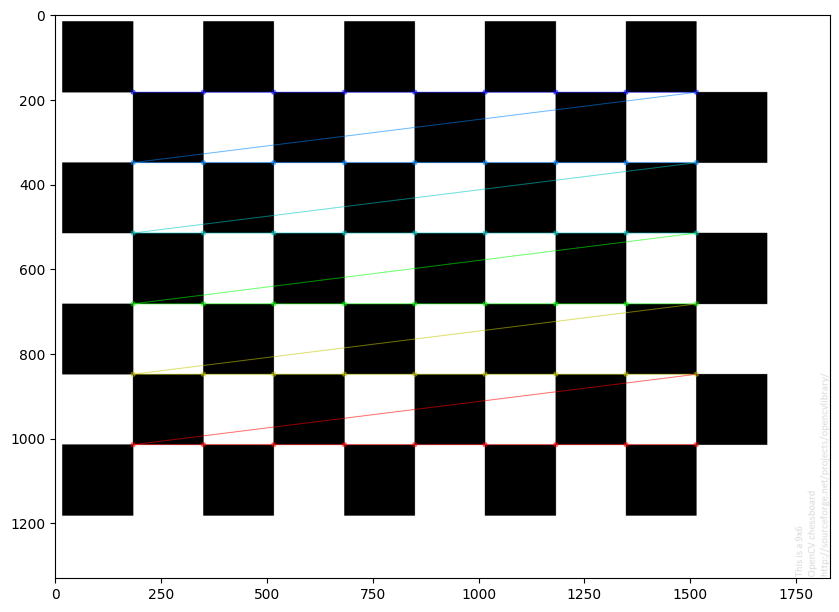

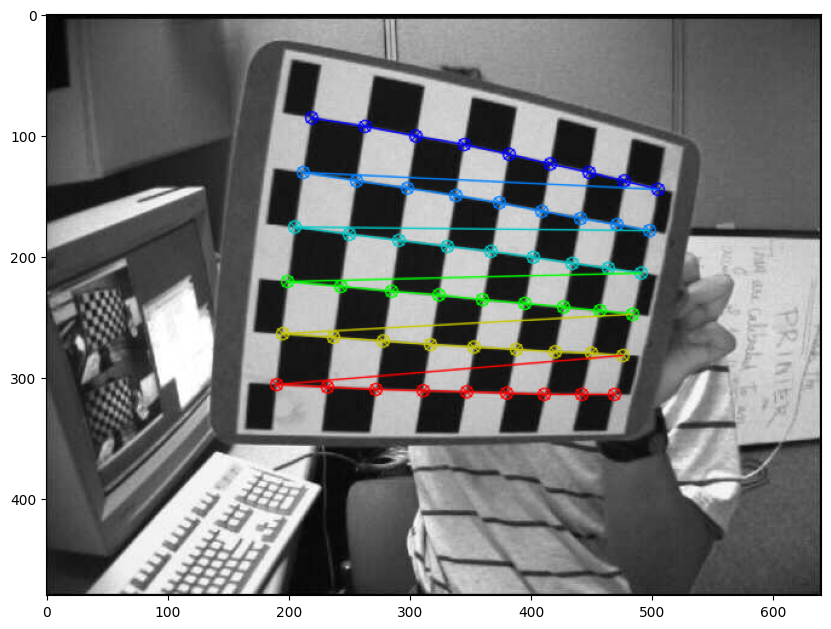

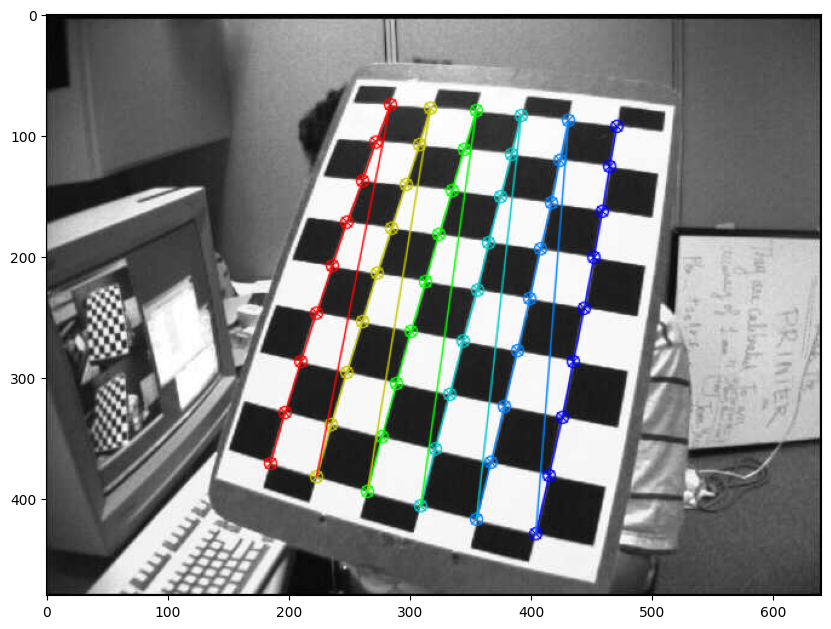

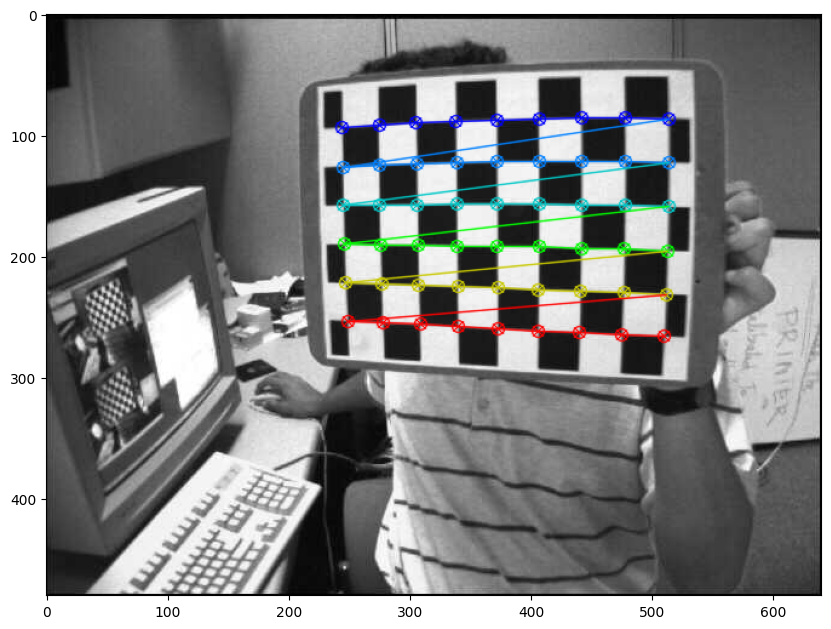

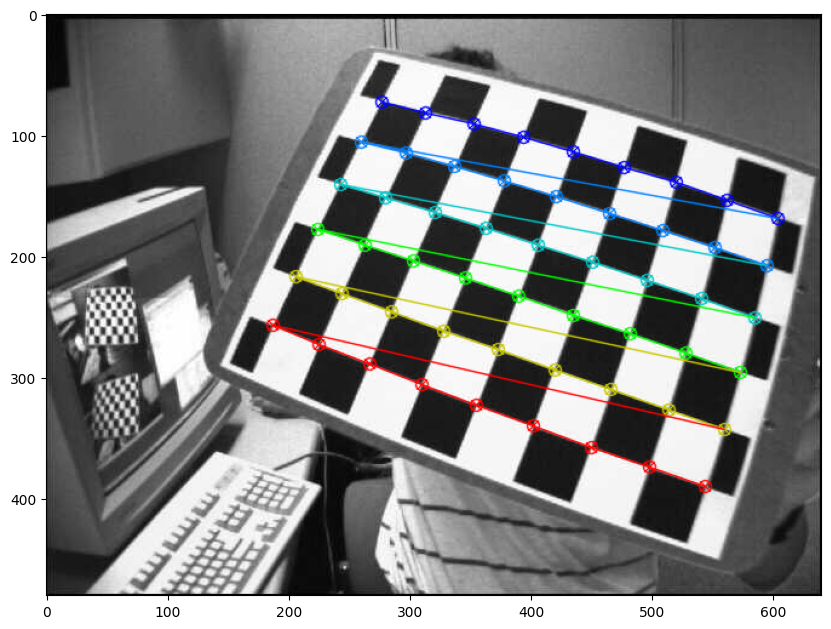

...

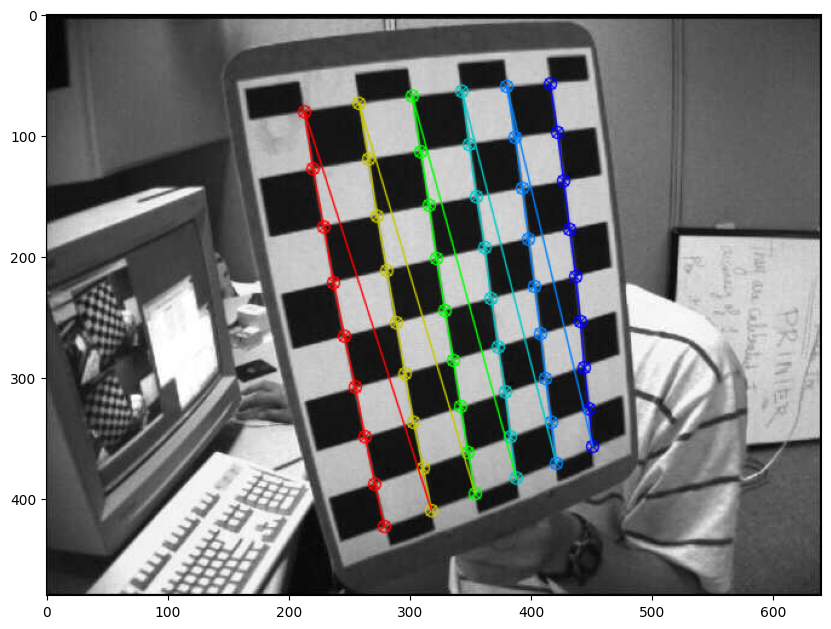

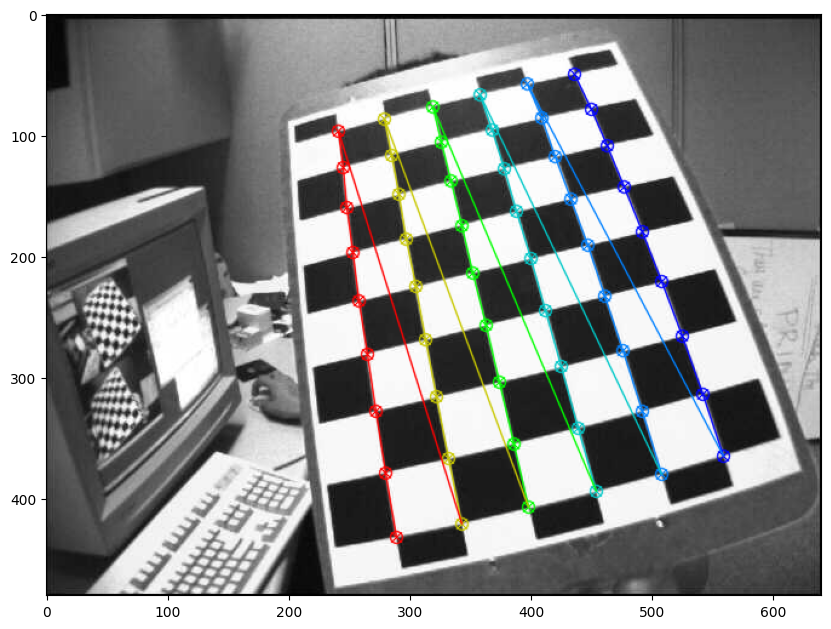

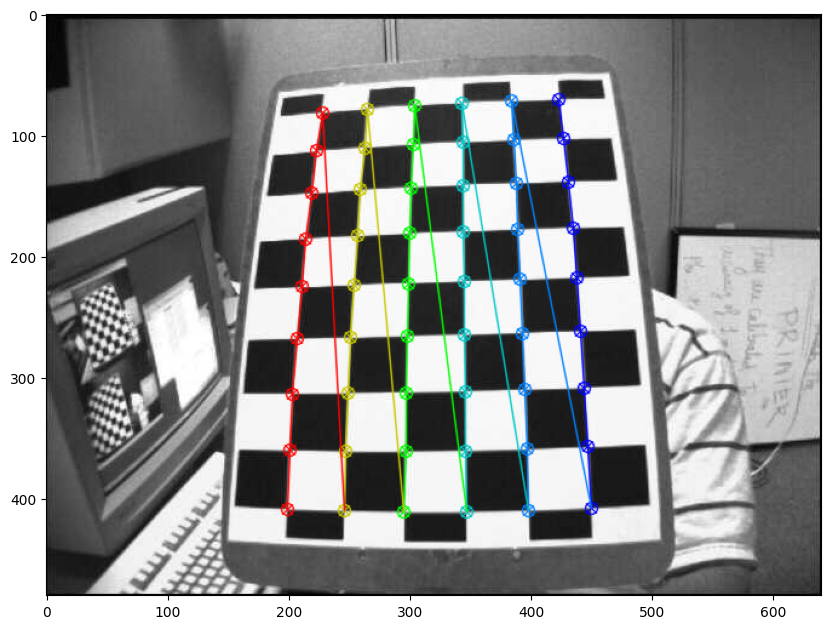

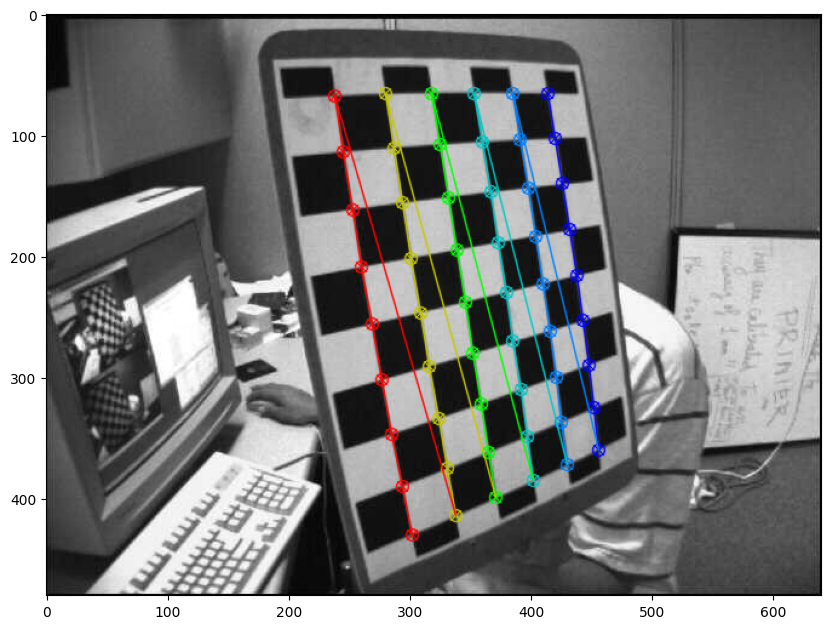

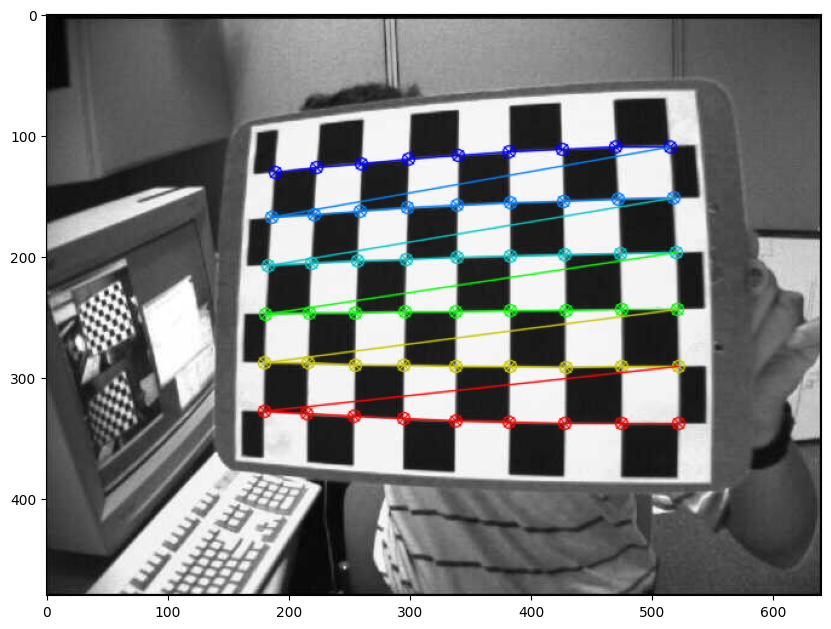

(f_x, f_y) : (531.1498939398102, 531.4337558665854)
(c_x, c_y) : (341.8229342710978, 235.04374205274124)
distorsion (k_1, k_2, p_1, p_2, k_3) : [-2.74375239e-01 -3.09693540e-02  8.95291856e-04 -2.21901576e-04]


In [5]:
calibrator_left = Calibrator("./checker_board_9x6_corners.png")
calibrator_left.template.draw_corners()

# loop in ./left
for file in glob.glob("./left/*"):
    chessboard = Chessboard(file)
    if chessboard.ret:
        calibrator_left.add_chessboard(chessboard)

        chessboard.draw_corners()

calibrator_left.calibrate()
matrix = calibrator_left.matrix
f = matrix[0][0], matrix[1][1]
c = matrix[0][2], matrix[1][2]
print(f"(f_x, f_y) : {f}")
print(f"(c_x, c_y) : {c}")
print(f"distorsion (k_1, k_2, p_1, p_2, k_3) : {calibrator_left.distorsion}")


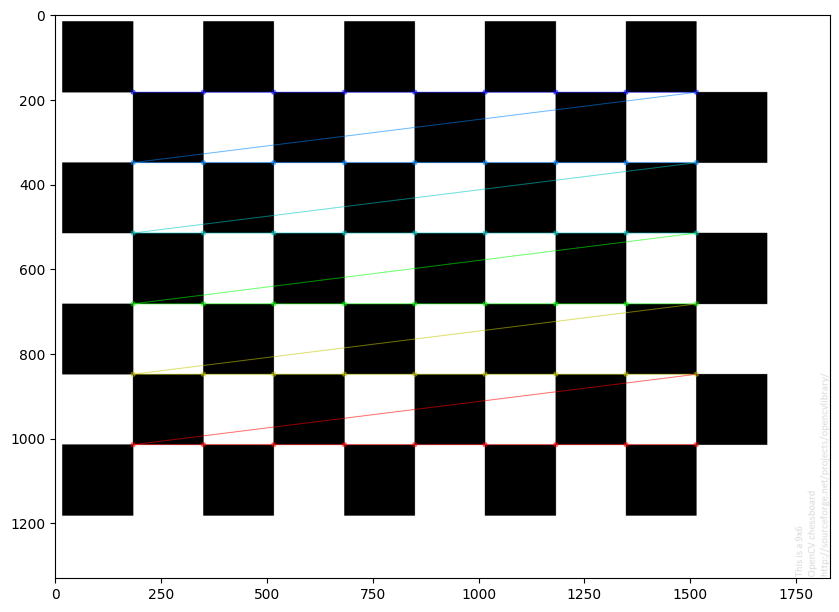

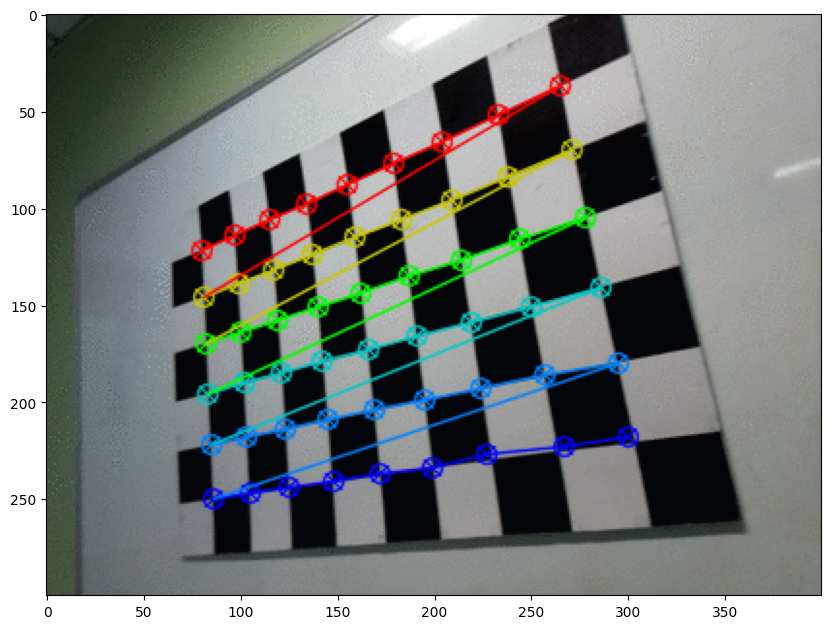

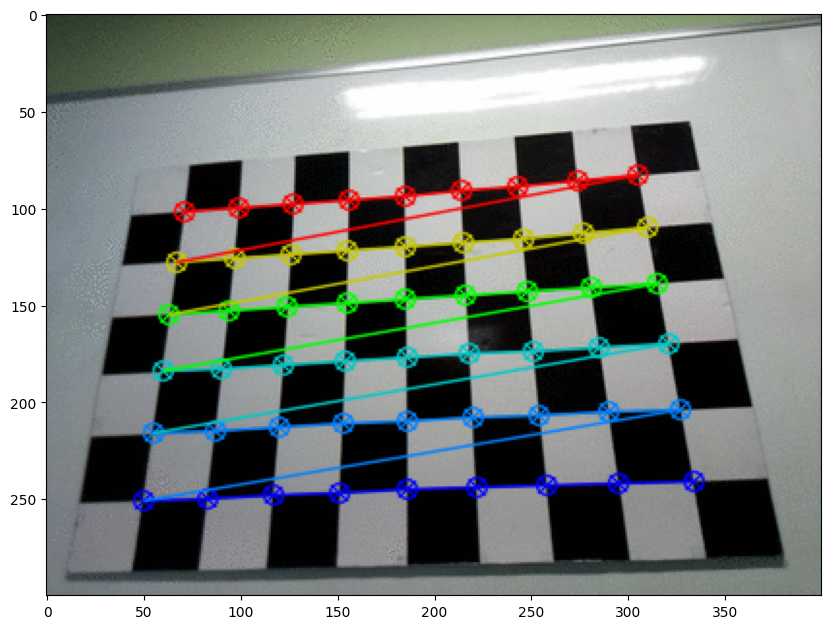

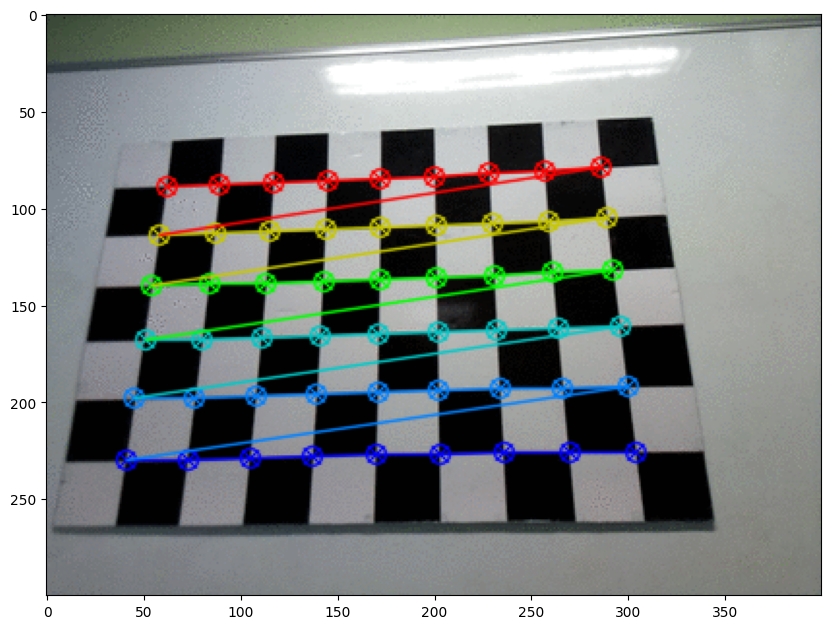

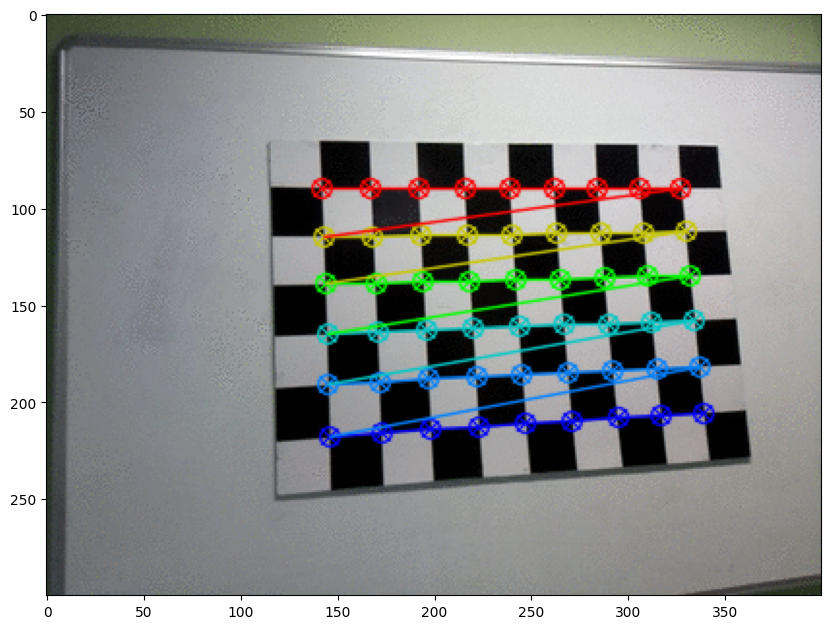

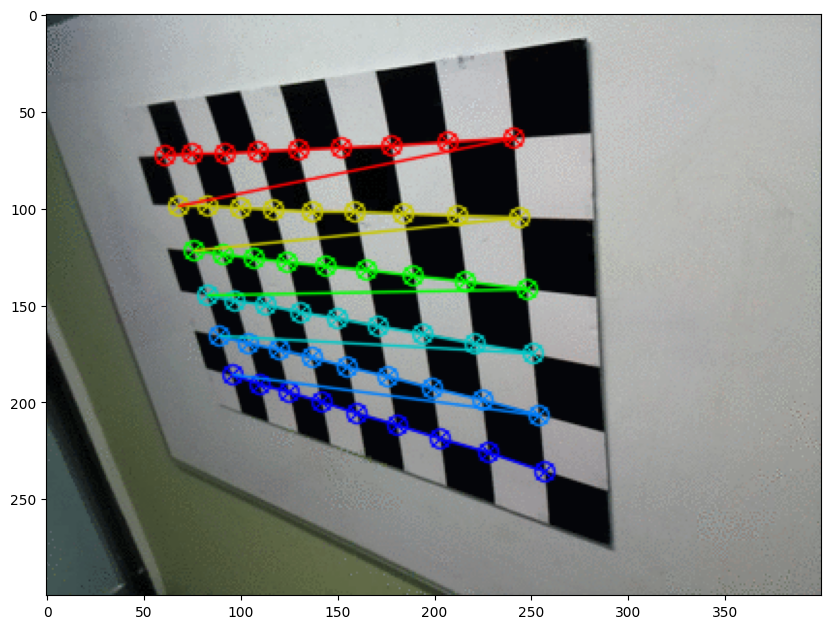

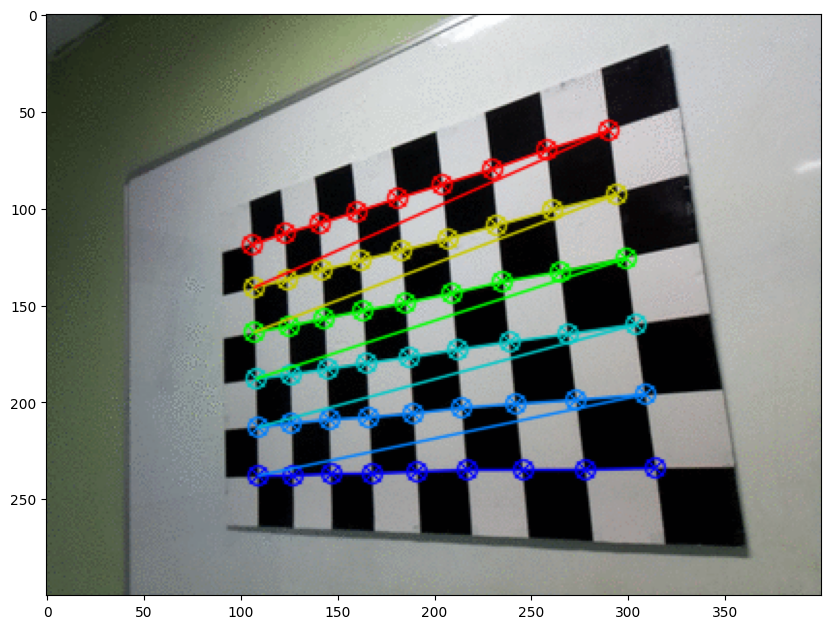

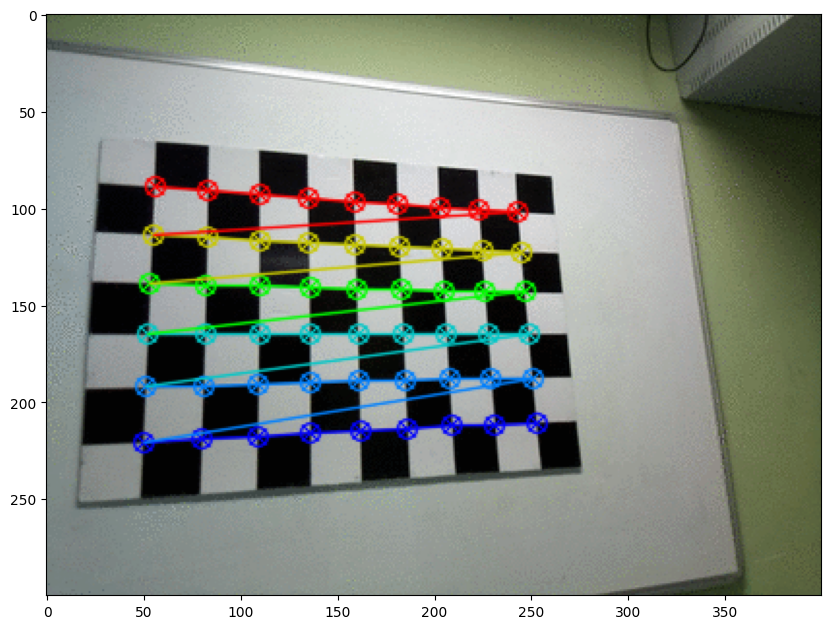

(f_x, f_y) : (531.1498939398102, 531.4337558665854)
(c_x, c_y) : (341.8229342710978, 235.04374205274124)
distorsion (k_1, k_2, p_1, p_2, k_3) : [-0.07793738 -0.39296629  0.00818373 -0.0308516 ]


In [6]:
calibrator_frame = Calibrator("./checker_board_9x6_corners.png")
calibrator_frame.template.draw_corners()

# loop in ./frame
for file in glob.glob("./frame/*"):
    chessboard = Chessboard(file)
    if chessboard.ret:
        calibrator_frame.add_chessboard(chessboard)

        chessboard.draw_corners()

calibrator_frame.calibrate()
mtx = calibrator_frame.matrix
f = matrix[0][0], matrix[1][1]
c = matrix[0][2], matrix[1][2]
print(f"(f_x, f_y) : {f}")
print(f"(c_x, c_y) : {c}")
print(f"distorsion (k_1, k_2, p_1, p_2, k_3) : {calibrator_frame.distorsion}")


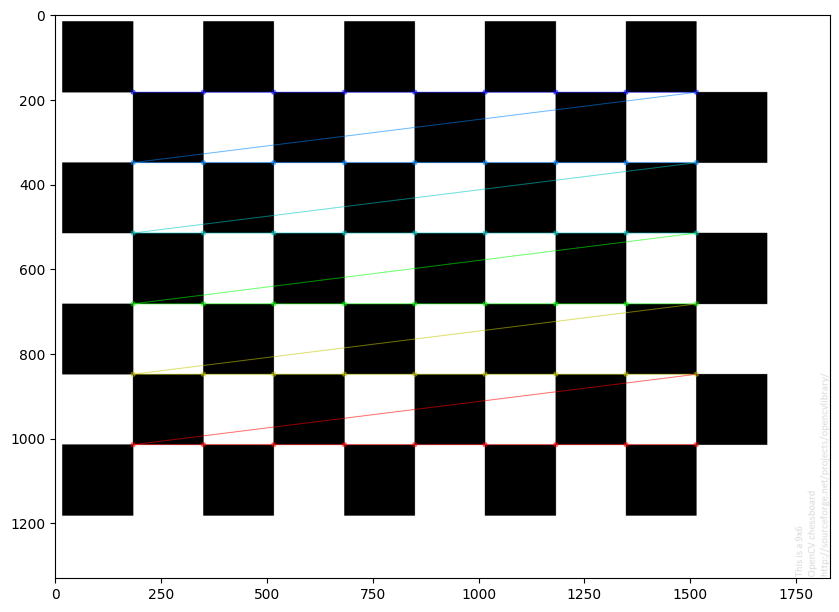

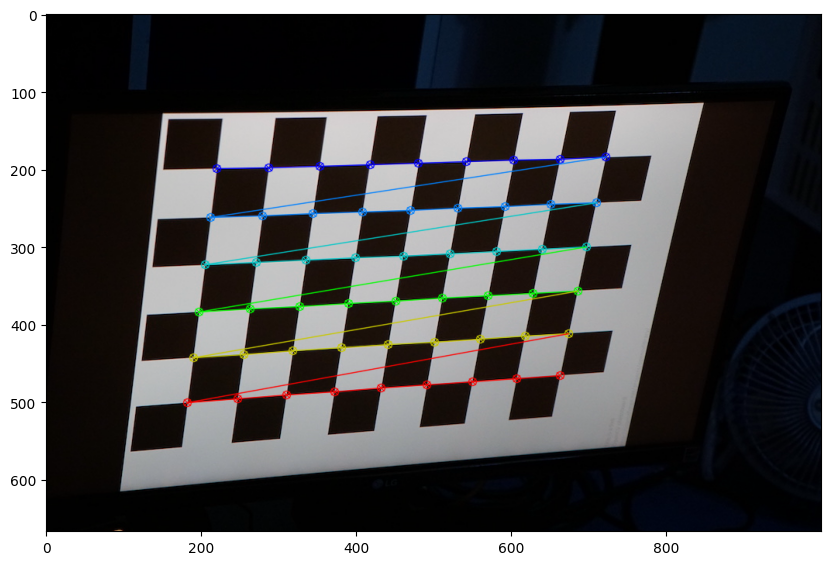

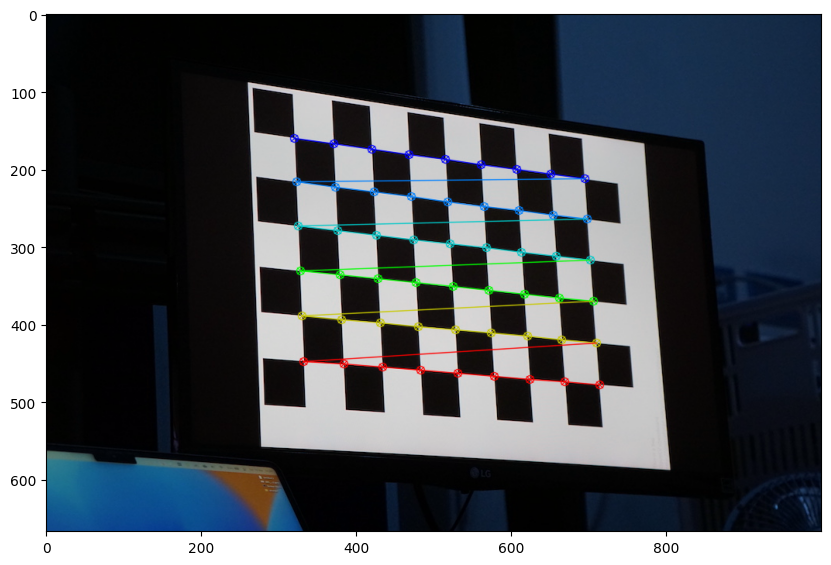

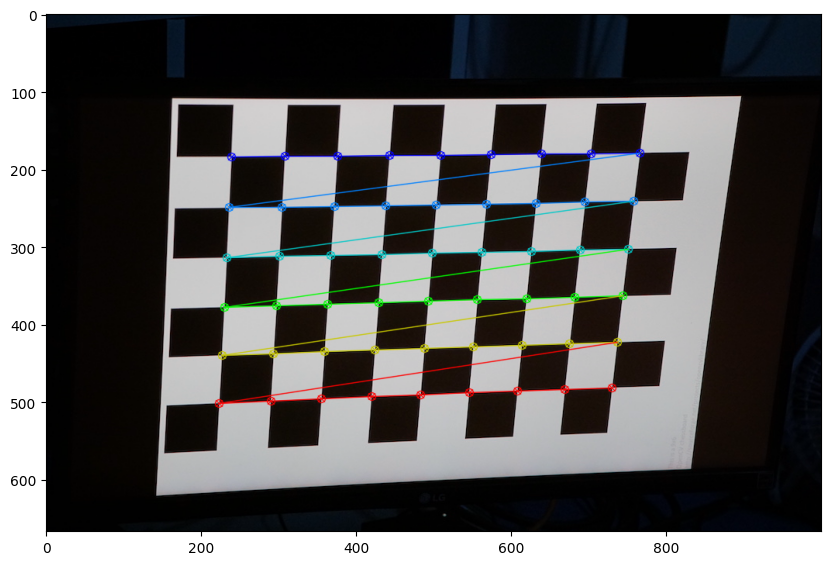

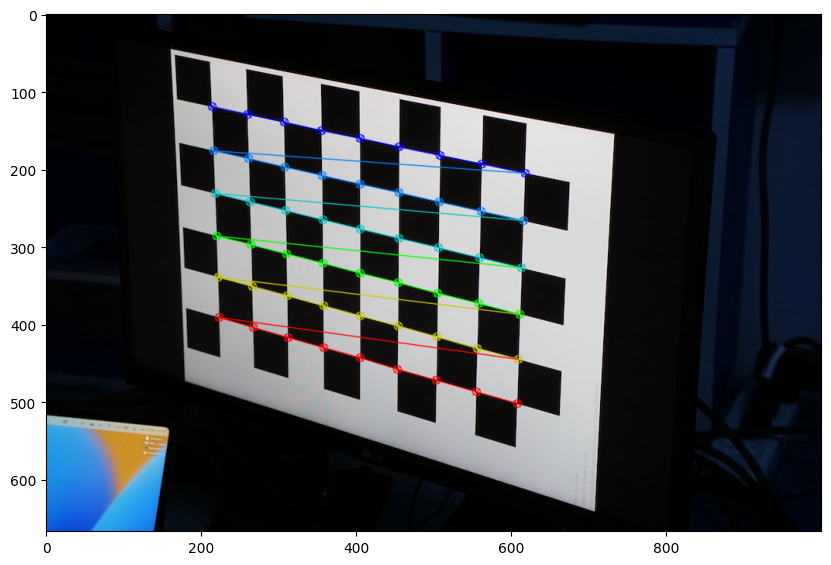

...

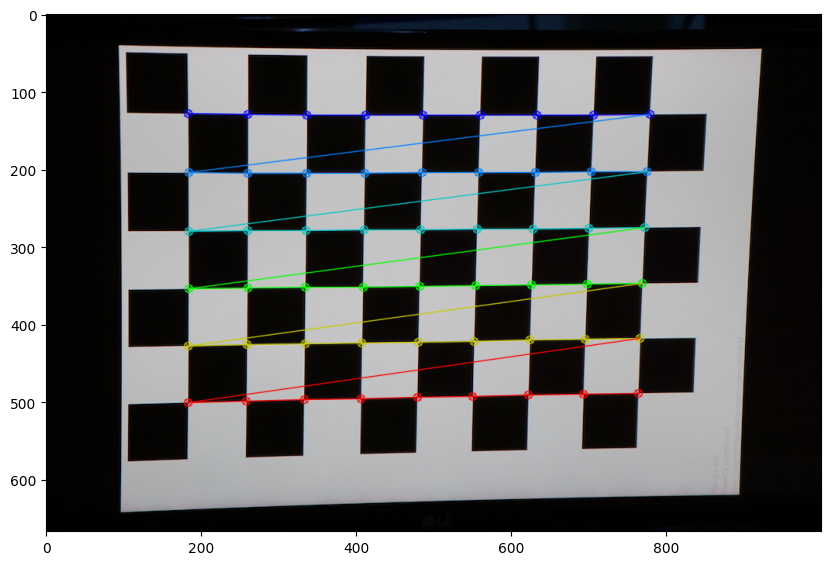

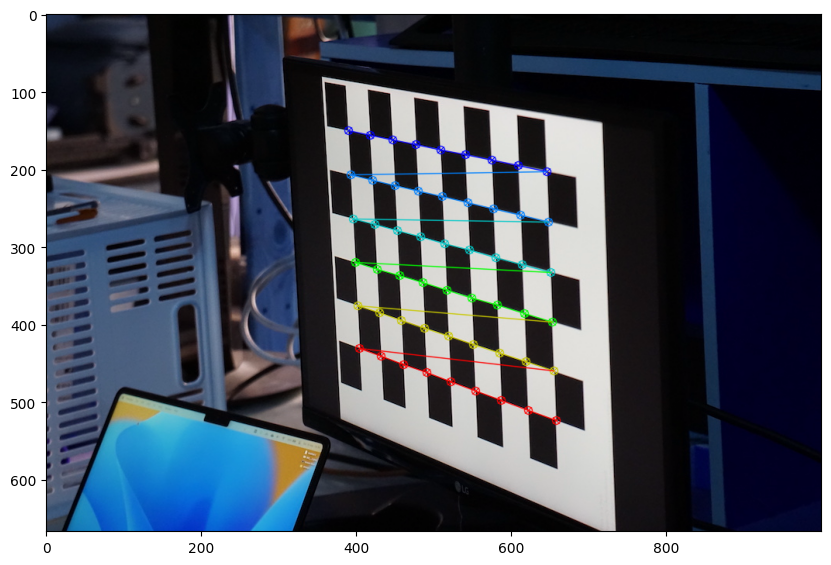

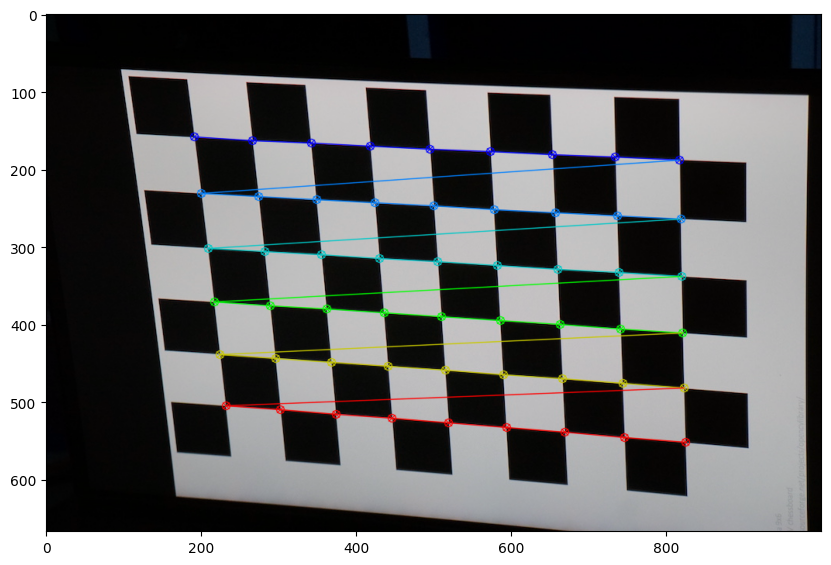

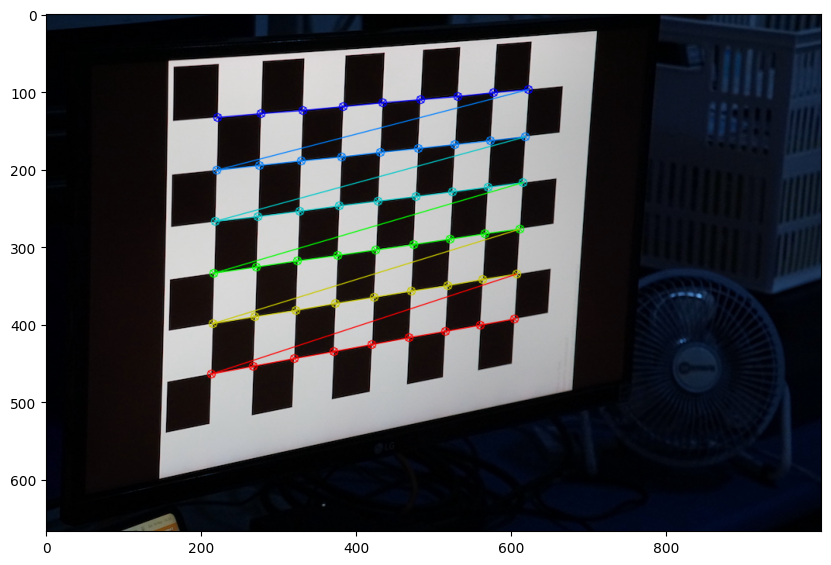

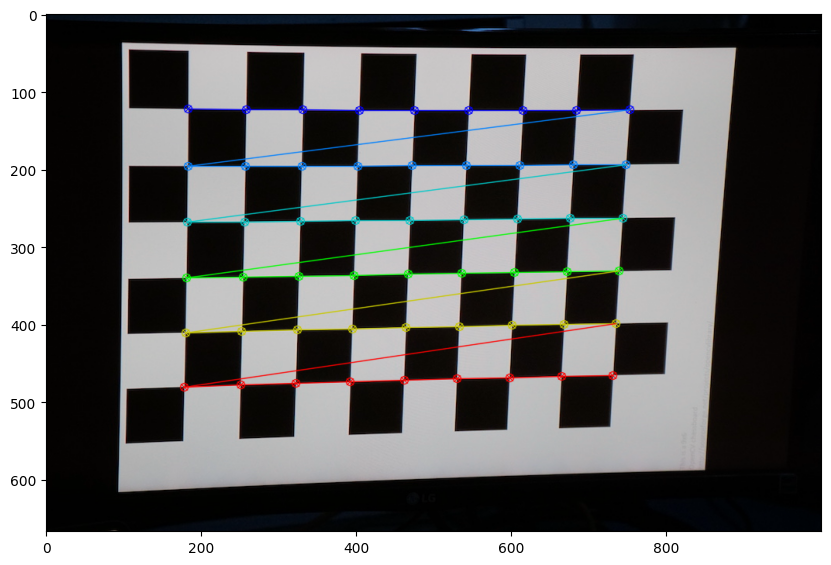

(f_x, f_y) : (531.1498939398102, 531.4337558665854)
(c_x, c_y) : (341.8229342710978, 235.04374205274124)
distorsion (k_1, k_2, p_1, p_2, k_3) : [ 0.39016339 -4.90683902  0.01616497  0.03293449]


In [7]:
calibrator_me = Calibrator("./checker_board_9x6_corners.png")
calibrator_me.template.draw_corners()

# loop in ./frame
for file in glob.glob("./me/*"):
    chessboard = Chessboard(file)
    if chessboard.ret:
        calibrator_me.add_chessboard(chessboard)

        chessboard.draw_corners()

calibrator_me.calibrate()
mtx = calibrator_me.matrix
f = matrix[0][0], matrix[1][1]
c = matrix[0][2], matrix[1][2]
print(f"(f_x, f_y) : {f}")
print(f"(c_x, c_y) : {c}")
print(f"distorsion (k_1, k_2, p_1, p_2, k_3) : {calibrator_me.distorsion}")


> 10 points.

##### 1.2 Show the Original and Undistorted image for one of your checkerboard images. Draw straight lines across the original image and undistorted image to see if the distortion has improved.

> Lens information for the camera used in this lab: `28-70mm F3.5-5.6`

<div style="display: flex">
<image style="width: 25%;margin-right: auto" src="https://www.lenslineup.com/wp-content/uploads/2020/07/28-70.png"/>
<figure>
<image style="width: 50%" src="https://www.sony-asia.com/image/feec82794200ee8405e713b5bd18ccbe?fmt=jpeg&wid=1200&qlt=43"/>
<figcaption>[1] Aspherical  [2] ED (extra-low dispersion) glass</figcaption>
</figure>
</div>

In [8]:
image = "./me/me0.JPG"

original = Chessboard(image)
undistorted = Chessboard(image)
undistorted.undistorted(calibrator_me.matrix, calibrator_me.distorsion)

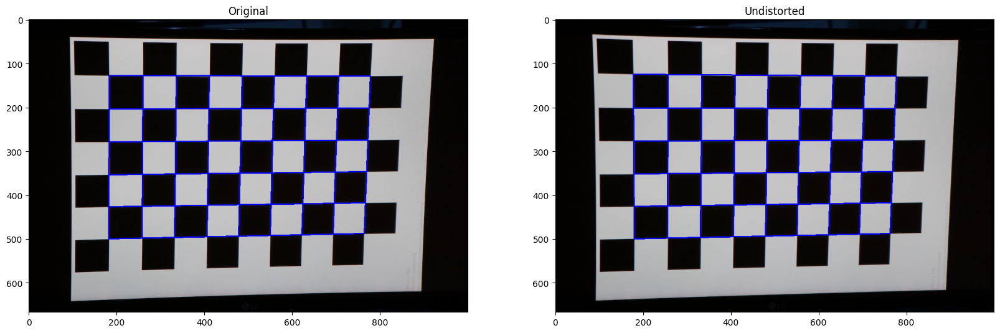

In [9]:
# plot
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(original.draw_straight_lines())
plt.title("Original")
plt.subplot(1, 2, 2)
plt.title("Undistorted")
plt.imshow(undistorted.draw_straight_lines())
plt.show()

*Since my lens is highly configured, so I will show one of `left` photo*

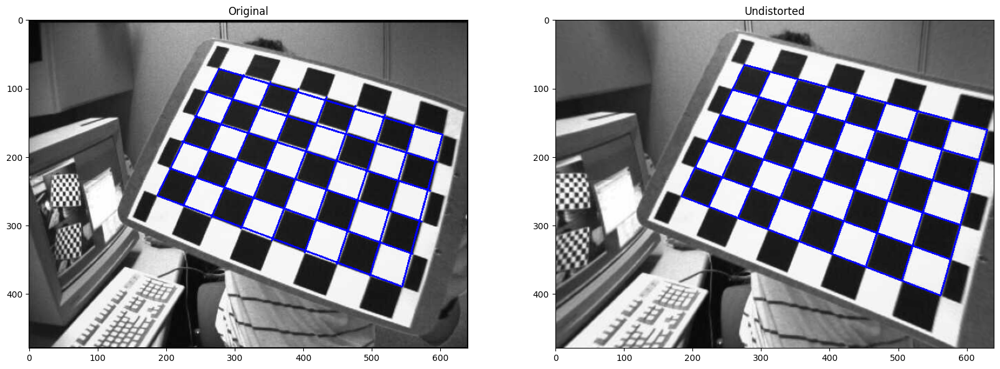

In [10]:
image = "./left/left03.jpg"

original = Chessboard(image)
undistorted = Chessboard(image)
undistorted.undistorted(calibrator_left.matrix, calibrator_left.distorsion)

# plot
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(original.draw_straight_lines())
plt.title("Original")
plt.subplot(1, 2, 2)
plt.title("Undistorted")
plt.imshow(undistorted.draw_straight_lines())
plt.show()